In [2]:
#5.11 high way
# last modified 2024/4/24 
# %matplotlib ipympl
%matplotlib inline
import h5py 
import glob
from scipy import signal
import numpy as np
import matplotlib.pyplot as plt
from DasTools import DasPrep as dp
import os
import datetime
import matplotlib
import logging
import csv
import time
def concat(flist , start = 0 , span = 20 ):
    datalist = []

    for fname in flist[ start : min( start + span , len(flist) ) ]:
        data = dp.read_das(fname)
        datalist.append(data)

    
    data = np.concatenate(datalist, axis = 1)
    utc_datetime = datetime.datetime.strptime(flist[start][-22 : -7],'%Y%m%d_%H%M%S') + datetime.timedelta(hours=+8)
    utc_day = utc_datetime.strftime("%m-%d %H:%M")
    print("cat", data.shape)
    return data , utc_datetime, utc_day 


def psd(h5file , startn, endn , span_each_pic , dt , window ):
    with h5py.File(h5file, 'w') as f:
    # 创建一个dataset
        concat_time = 0
        for n in range(startn, endn , span_each_pic):
            data , utc_datetime, utc_day = concat(flist , start= n ,span= span_each_pic)
            ch_list = [i for i in range(0,len(data))]

            fs = 1/dt
            data = dp.das_preprocess(data)
            nfft = window*fs
            start = time.time()
            for i in range(len(ch_list)):
                ch = ch_list[i]
                if not f.__contains__(str(ch_list[i])):   #判断这个组存不存在
                    g = f.create_group(str(ch_list[i]))
                else:
                    g = f[str(ch_list[i])]
                # g =  f.create_group(str(ch_list[i]))  
                [f1,Pxx1] = signal.welch(data[i],                   # 随机信号
                                nfft=nfft,               # 每个窗的长度
                                fs=fs,                   # 采样频率   
                                average='median' , 
                                # detrend='mean',          # 去掉均值
                                window=np.hanning(nfft), # 加汉尼窗
                                noverlap=int(nfft*3/4),  # 每个窗重叠75%的数据
                                )        # 求单边谱
                g.create_dataset(str(utc_day),  data=Pxx1 )
            concat_time +=  time.time() -start
            print(n , "拼接运行时间:%.2f min %d s"%( int(concat_time / 60) , concat_time%60) , datetime.datetime.now() , utc_day, "check in ")
        f.close()



flist = glob.glob('/mnt/f/Highway_2024_0510/Waihuan_HW_0628/data2/*.h5')
flist.sort()
print(len(flist))

path = '/mnt/f/Highway_2024_0510/output/0628_data2/psd_7_1/'
if not os.path.exists(path):
    os.makedirs(path)

h5fname = path+ '/psd_7_3.hdf5'
psd(h5fname , 480, 643 , 4 , dt= 0.002 , window=6 ) 



664
cat (4224, 60000)
480 拼接运行时间:0.00 min 55 s 2024-07-02 15:13:04.834872 06-28 14:28 check in 
cat (4224, 60000)
484 拼接运行时间:1.00 min 50 s 2024-07-02 15:14:28.659329 06-28 14:30 check in 
cat (4224, 60000)
488 拼接运行时间:2.00 min 39 s 2024-07-02 15:15:43.812835 06-28 14:32 check in 
cat (4224, 60000)
492 拼接运行时间:3.00 min 33 s 2024-07-02 15:17:03.598940 06-28 14:34 check in 
cat (4224, 60000)
496 拼接运行时间:4.00 min 23 s 2024-07-02 15:18:19.192507 06-28 14:36 check in 
cat (4224, 60000)
500 拼接运行时间:5.00 min 15 s 2024-07-02 15:19:38.641405 06-28 14:38 check in 
cat (4224, 60000)
504 拼接运行时间:6.00 min 7 s 2024-07-02 15:20:56.943870 06-28 14:40 check in 
cat (4224, 60000)
508 拼接运行时间:7.00 min 0 s 2024-07-02 15:22:15.776584 06-28 14:42 check in 
cat (4224, 60000)
512 拼接运行时间:7.00 min 57 s 2024-07-02 15:23:39.056231 06-28 14:44 check in 
cat (4224, 60000)
516 拼接运行时间:8.00 min 52 s 2024-07-02 15:25:00.346859 06-28 14:46 check in 
cat (4224, 60000)
520 拼接运行时间:9.00 min 46 s 2024-07-02 15:26:20.762112 06-28 14

In [5]:
h5fname = path+ '/test03_05_10_1.hdf5'

with h5py.File(h5fname, 'w') as f:
    print(h5fname)


/mnt/f/Highway_2024_0510/output/psd_6_14//test03_05_10_1.hdf5


In [ ]:
import os
import scipy
from DasTools import DasPrep as dp
import h5py
import glob
from scipy import signal
import numpy as np
import matplotlib.pyplot as plt
import os
import time

##########################################
def plot_sub_set(ax  , xsticks = [] , ysticks = []  , xlabel = '', ylabel = '', title = '', c = -1 , r = 1):
    fonts = 15
    if c > 0 :
        ax.set_yticks([])
    else:
        ax.set_yticks(ysticks[0],ysticks[1])
        ax.set_ylabel(ylabel,fontsize=fonts)
    ax.set_xticks([])
    if r < 0 :
        ax.set_xticks([0],[xsticks[0]*8], rotation=90)
    elif r == 2 and c%2 == 1 and c//2 > 0 :
        ax.set_xticks([0],[c//2])
    # ax.set_xlabel(xlabel,fontsize=fonts)
    ax.grid()
    # ax.set_title(title,fontsize=fonts)
    ax.tick_params(axis='x', labelsize=fonts-5)
    ax.tick_params(axis='y', labelsize=fonts-5)



def show_ifft_time_range_amtitude_channel_split(flist  , ch_list, frequencise ,  dis_spacing ,  title ,  
                                                save_path ,split , t_range = [0,-1] , 
                                                lp = 1 , hp = 200 ,
                                                w = 20,
                                                start_time = None , end_time = None ,psdfile = None  ):
    if not os.path.exists(save_path):
        os.makedirs(save_path)
    all_AC = []
    all_psd = []
    if psdfile is None:
        for ch in ch_list:
            for fi in flist:
                with h5py.File(fi, 'r') as f:
                    if len(f[str(ch)].keys()) == 1 :
                        dset = f[str(ch)]['01']
                    else:
                        dset = f[str(ch)]
                    time = [i for i in dset.keys()][t_range[0] : t_range[-1]]
                    
                    if start_time is not None and end_time is not None : 
                        time = time[time.index(start_time):time.index(end_time)+1]
                    psd = np.average([dset[ti] for ti in time] ,axis=0)
                    all_psd.append(psd)
                    AC = np.fft.ifft( np.abs(np.append(psd[::-1][:-2] , psd)))
                    f.close()
                    # AC = np.fft.fftshift(AC)
                    all_AC.append(np.abs(AC[: len(AC)//2]))


        with h5py.File(save_path+'acf' +'.hdf5', 'w') as f:
            f.create_dataset(str(time),  data=all_AC )
            f.close()
    else:
        with h5py.File(psdfile, 'r') as f:
            all_psd = np.array(f['psd'][ch_list[0] : ch_list[1], :])
            print(all_psd.shape)
            all_AC = np.abs(np.fft.ifft2(np.append(all_psd[::-1 , ] , all_psd ,axis= 1))[: , : len(all_psd[0])])
            time = ""
            print(all_AC.shape)

    all_AC = all_AC[:,:1001]
    all_psd=all_psd[:,:601]
    sum_psd = np.sum(all_psd,axis = 1)    
    balenced_psd =  np.divide(all_psd.T,sum_psd /70000).T
    print(balenced_psd.std() ,all_psd.std()) 
    all_AC = np.divide(all_AC.T , sum_psd /70000 ).T
    rolling_mean = np.array ([ np.convolve(ac, np.ones(w), "valid") / w for ac in all_AC] )
    deco = np.array([scipy.signal.deconvolve(all_AC[i] , rolling_mean[i])[1] for i in range(len(all_AC))])
    filter_data = dp.bandpass(deco, 0.001, lp , hp )
    title = "w = " + str(w) + " " + str(lp) + "-" + str(hp) + " Hz"
    # filter_data = dp.lowpass(deco, 0.001, 60 )

    fq_stick = [ np.linspace(0,len(all_psd[0]),11) ,np.linspace(0,frequencise//10,11) ]
    time_stick = [np.linspace(0,len(all_AC[0]) , 4) ,np.around( np.linspace(0, len(all_AC[0])/frequencise , 4 ) , 1) ]
    ch_stick = [range(0,len(all_psd),50) , range(ch_list[0], ch_list[1],50)]
    w_r = [ ]
    sp_ch_list= []
    start_ch = 0
    for i in split:
        w_r.append(  np.ceil((i - start_ch)/10))
        sp_ch_list.append([start_ch, i])
        start_ch = i
    
    print(w_r , sp_ch_list)
    fig, ax_list = plt.subplots(3, len(split), gridspec_kw={"width_ratios": w_r, "height_ratios": [1, 1, 1]} , figsize=(20, 12 ))

    filter_data_s = filter_data/np.max(filter_data) * 20

    ax_r1 , ax_r2 , ax_r3 = ax_list
    for c in range(len(split)):
        sp_ch = sp_ch_list[c]
        ax_r1[c].imshow(np.log(all_psd[sp_ch[0] : sp_ch[1]]).T, aspect='auto', cmap='jet', vmin=0, vmax=15)
        plot_sub_set(ax_r1[c],sp_ch , fq_stick , 'Channel sp = 8 m' , 'fq(Hz)' , "log(PSD)"+title + time , c)
        ax_r2[c].imshow(np.log(balenced_psd[sp_ch[0] : sp_ch[1]]).T, aspect='auto', cmap='jet', vmin=0, vmax=7)
        plot_sub_set(ax_r2[c],sp_ch , fq_stick , 'Channel sp = 8 m' , 'fq(Hz)' , "balance (PSD)"+title + time ,c , r = 2)
        ax_r3[c].imshow(filter_data_s[sp_ch[0] : sp_ch[1]].T, aspect='auto', cmap='gray', vmin=0, vmax=filter_data_s[sp_ch[0] : sp_ch[1]].std()/5)
        plot_sub_set(ax_r3[c],sp_ch , time_stick , 'Channel sp = 8 m' , 'Time (s)' , "10-100 Hz filter , w = "+str(w)+title + time,c , r = -1)
    # plt.tight_layout() 
    # plt.suptitle(title + " PSD -> Balanced -> AC")
    plt.savefig(save_path+time+title+str(ch_list))
    
    # plt.show()
    plt.close()

    for c in range(len(split)):
        sp_ch = sp_ch_list[c]
        plt.figure(figsize=[6,2])
        plt.imshow(filter_data_s[sp_ch[0] : sp_ch[1]].T, aspect='auto', cmap='gray', vmin=0, vmax=filter_data_s[sp_ch[0] : sp_ch[1]].std()/5)
        plt.yticks(time_stick[0] , time_stick[1])
        if c%2 == 1 and c//2 > 0 :
            plt.title("AC Bridge "+ str(c//2))
        elif c == 2:
            plt.title("AC Tunnel")

        else:
            plt.title("AC road after Bridge "+ str(c//2-1))
        plt.xticks([0 , sp_ch[1] - sp_ch[0] - 1 ] , [sp_ch[0]*8 , sp_ch[1]*8])
        plt.ylabel("Time (s)")
        plt.xlabel("Location (m)")
        plt.savefig(save_path+time+title+str(sp_ch))
        plt.show()
        plt.close()
        # plot_sub_set(ax_r3[c],sp_ch , time_stick , 'Channel sp = 8 m' , 'Time (s)' , "10-100 Hz filter , w = "+str(w)+title + time,c , r = -1)



mutation_stamp = [ 43, 131,  390,406, 427, 434,   470,     553, 587,    625,  679,  685,  745, 761, 770, 855, 865, 888, 930, 966, 1011,
                  1059, 1157, 1251,  1310, 1343,  1381, 1390, 1411, 1570, 1788, 1804, 1860, 1898, 1968, 2024 ,2175]
show_ifft_time_range_amtitude_channel_split(psdfile='/mnt/f/Highway_2024_0510/output/psd_5_11_v3/test03_05_10_all_psd.hdf5', 
                                            flist=[] , ch_list = [0,2176] , frequencise= 1000 , dis_spacing= 8 , title='high way   ' , 
                                            split=mutation_stamp,
                                            w = 200 , lp = 1 , hp = 100,
                                            save_path='/mnt/f/Highway_2024_0510/output/psd_5_11_v3/')



In [ ]:
import os
import scipy
from DasTools import DasPrep as dp
import h5py
import glob
from scipy import signal
import numpy as np
import matplotlib.pyplot as plt
import os
import time

##########################################
def plot_sub_set(ax  , xsticks = [] , ysticks = []  , xlabel = '', ylabel = '', title = '', c = -1 , r = 1):
    fonts = 15
    if c > 0 :
        ax.set_yticks([])
    else:
        ax.set_yticks(ysticks[0],ysticks[1])
        ax.set_ylabel(ylabel,fontsize=fonts)
    ax.set_xticks([])
    if r < 0 :
        ax.set_xticks([0],[xsticks[0]*8], rotation=90)
    elif r == 2 and c%2 == 1 and c//2 > 0 :
        ax.set_xticks([0],[c//2])
    # ax.set_xlabel(xlabel,fontsize=fonts)
    ax.grid()
    # ax.set_title(title,fontsize=fonts)
    ax.tick_params(axis='x', labelsize=fonts-5)
    ax.tick_params(axis='y', labelsize=fonts-5)



def show_ifft_time_range_amtitude_channel_split(flist  , ch_list, frequencise ,  dis_spacing ,  title ,  
                                                save_path ,split , t_range = [0,-1] , 
                                                lp = 1 , hp = 200 ,
                                                w = 20,
                                                start_time = None , end_time = None ,psdfile = None  ):
    if not os.path.exists(save_path):
        os.makedirs(save_path)
    all_AC = []
    all_psd = []
    if psdfile is None:
        for ch in ch_list:
            for fi in flist:
                with h5py.File(fi, 'r') as f:
                    if len(f[str(ch)].keys()) == 1 :
                        dset = f[str(ch)]['01']
                    else:
                        dset = f[str(ch)]
                    time = [i for i in dset.keys()][t_range[0] : t_range[-1]]
                    
                    if start_time is not None and end_time is not None : 
                        time = time[time.index(start_time):time.index(end_time)+1]
                    psd = np.average([dset[ti] for ti in time] ,axis=0)
                    all_psd.append(psd)
                    AC = np.fft.ifft( np.abs(np.append(psd[::-1][:-2] , psd)))
                    f.close()
                    # AC = np.fft.fftshift(AC)
                    all_AC.append(np.abs(AC[: len(AC)//2]))


        with h5py.File(save_path+'acf' +'.hdf5', 'w') as f:
            f.create_dataset(str(time),  data=all_AC )
            f.close()
    else:
        with h5py.File(psdfile, 'r') as f:
            all_psd = np.array(f['psd'][ch_list[0] : ch_list[1], :])
            print(all_psd.shape)
            all_AC = np.abs(np.fft.ifft2(np.append(all_psd[::-1 , ] , all_psd ,axis= 1))[: , : len(all_psd[0])])
            time = ""
            print(all_AC.shape)

    all_AC = all_AC[:,:1001]
    all_psd=all_psd[:,:601]
    sum_psd = np.sum(all_psd,axis = 1)    
    balenced_psd =  np.divide(all_psd.T,sum_psd /70000).T
    print(balenced_psd.std() ,all_psd.std()) 
    all_AC = np.divide(all_AC.T , sum_psd /70000 ).T
    rolling_mean = np.array ([ np.convolve(ac, np.ones(w), "valid") / w for ac in all_AC] )
    deco = np.array([scipy.signal.deconvolve(all_AC[i] , rolling_mean[i])[1] for i in range(len(all_AC))])
    filter_data = dp.bandpass(deco, 0.001, lp , hp )
    title = "w = " + str(w) + " " + str(lp) + "-" + str(hp) + " Hz"
    # filter_data = dp.lowpass(deco, 0.001, 60 )

    fq_stick = [ np.linspace(0,len(all_psd[0]),11) ,np.linspace(0,frequencise//10,11) ]
    time_stick = [np.linspace(0,len(all_AC[0]) , 4) ,np.around( np.linspace(0, len(all_AC[0])/frequencise , 4 ) , 1) ]
    ch_stick = [range(0,len(all_psd),50) , range(ch_list[0], ch_list[1],50)]
    w_r = [ ]
    sp_ch_list= []
    start_ch = 0
    for i in split:
        w_r.append(  np.ceil((i - start_ch)/10))
        sp_ch_list.append([start_ch, i])
        start_ch = i
    
    print(w_r , sp_ch_list)
    fig, ax_list = plt.subplots(3, len(split), gridspec_kw={"width_ratios": w_r, "height_ratios": [1, 1, 1]} , figsize=(20, 12 ))

    filter_data_s = filter_data/np.max(filter_data) * 20

    ax_r1 , ax_r2 , ax_r3 = ax_list
    for c in range(len(split)):
        sp_ch = sp_ch_list[c]
        ax_r1[c].imshow(np.log(all_psd[sp_ch[0] : sp_ch[1]]).T, aspect='auto', cmap='jet', vmin=0, vmax=15)
        plot_sub_set(ax_r1[c],sp_ch , fq_stick , 'Channel sp = 8 m' , 'fq(Hz)' , "log(PSD)"+title + time , c)
        ax_r2[c].imshow(np.log(balenced_psd[sp_ch[0] : sp_ch[1]]).T, aspect='auto', cmap='jet', vmin=0, vmax=7)
        plot_sub_set(ax_r2[c],sp_ch , fq_stick , 'Channel sp = 8 m' , 'fq(Hz)' , "balance (PSD)"+title + time ,c , r = 2)
        ax_r3[c].imshow(filter_data_s[sp_ch[0] : sp_ch[1]].T, aspect='auto', cmap='gray', vmin=0, vmax=filter_data_s[sp_ch[0] : sp_ch[1]].std()/5)
        plot_sub_set(ax_r3[c],sp_ch , time_stick , 'Channel sp = 8 m' , 'Time (s)' , "10-100 Hz filter , w = "+str(w)+title + time,c , r = -1)
    # plt.tight_layout() 
    # plt.suptitle(title + " PSD -> Balanced -> AC")
    plt.savefig(save_path+time+title+str(ch_list))
    
    # plt.show()
    plt.close()

    for c in range(len(split)):
        sp_ch = sp_ch_list[c]
        plt.figure(figsize=[6,2])
        plt.imshow(filter_data_s[sp_ch[0] : sp_ch[1]].T, aspect='auto', cmap='gray', vmin=0, vmax=filter_data_s[sp_ch[0] : sp_ch[1]].std()/5)
        plt.yticks(time_stick[0] , time_stick[1])
        if c%2 == 1 and c//2 > 0 :
            plt.title("AC Bridge "+ str(c//2))
        elif c == 2:
            plt.title("AC Tunnel")

        else:
            plt.title("AC road after Bridge "+ str(c//2-1))
        plt.xticks([0 , sp_ch[1] - sp_ch[0] - 1 ] , [sp_ch[0]*8 , sp_ch[1]*8])
        plt.ylabel("Time (s)")
        plt.xlabel("Location (m)")
        plt.savefig(save_path+time+title+str(sp_ch))
        plt.show()
        plt.close()
        # plot_sub_set(ax_r3[c],sp_ch , time_stick , 'Channel sp = 8 m' , 'Time (s)' , "10-100 Hz filter , w = "+str(w)+title + time,c , r = -1)



mutation_stamp = [ 43, 131,  390,406, 427, 434,   470,     553, 587,    625,  679,  685,  745, 761, 770, 855, 865, 888, 930, 966, 1011,
                  1059, 1157, 1251,  1310, 1343,  1381, 1390, 1411, 1570, 1788, 1804, 1860, 1898, 1968, 2024 ,2175]
show_ifft_time_range_amtitude_channel_split(psdfile='/mnt/f/Highway_2024_0510/output/psd_5_11_v3/test03_05_10_all_psd.hdf5', 
                                            flist=[] , ch_list = [0,2176] , frequencise= 1000 , dis_spacing= 8 , title='high way   ' , 
                                            split=mutation_stamp,
                                            w = 200 , lp = 1 , hp = 100,
                                            save_path='/mnt/f/Highway_2024_0510/output/psd_5_11_v3/')



In [ ]:
import h5py 
import numpy as np
import matplotlib.pyplot as plt
# ch_list = [40,150,300,450,600,700,830,910,1000,1200,1420]
ch_list =[i for i in range(4224)]
for ch in ch_list:
    psd = []
    all_time = []
    for fi in range(1,4):
        with h5py.File('mnt/f/Highway_2024_0510/output/0628_data2/psd_7_1/psd_7_'+str(fi)+'.h5', 'r') as f:
            print(f.keys())
            if len(f[str(ch)].keys()) == 1 :
                dset = f[str(ch)]['01']
            else:
                dset = f[str(ch)]
            time = [key for key in dset.keys()]
            # print(time)
            # start = time.index('20:00:12')
            # time = time[start:]+time[:start]
            # print(time)

            psd.append(  [dset[key][:] for key in time])
            all_time.append(time[:])
            f.close()
    print("-----------read",ch,"------------")
    
    print(len(psd))
    print(len(all_time))
    psd = np.concatenate(psd)
    time = np.concatenate(all_time)
    print(psd.shape, psd[:20])
    print(len(time))
    psd = np.log(psd)
    plt.figure(figsize=(30,10))
    plt.imshow(psd.T, aspect='auto', cmap='jet',vmin=0, vmax=15)
    # plt.imshow(psd.T, aspect='auto', cmap='viridis')
    plt.grid(alpha = 1)

    xstick = range(0, len(time))
    ystick = [300*i for i in range(10)]
    # print(f['frequency'].shape)

    plt.xticks(xstick , [time[i][-5:]  for i in xstick],rotation = 0)
    # plt.xticks(xstick , [time[i][:2]+" "+time[i][3:]  for i in xstick],rotation = 0)

    plt.yticks(ystick , ['%d'% (i/30.)  for i in ystick])
    plt.ylabel("Frequency")
    plt.xlabel("Time")
    plt.title("log(PSD) Highway 5.10 Channel="+str(ch)+" nfft=6000")

    plt.colorbar()
    plt.savefig('/mnt/f/Highway_2024_0510/output/psd_5_11_v2/test03_ch_'+str(ch)+'_psd.png') #10s per pic
    plt.close()


cal all psd and sum , save ,plot all psd

-----------read 0 ------------
-----------read 1 ------------
-----------read 2 ------------
-----------read 3 ------------
-----------read 4 ------------
-----------read 5 ------------
-----------read 6 ------------
-----------read 7 ------------
-----------read 8 ------------
-----------read 9 ------------
-----------read 10 ------------
-----------read 11 ------------
-----------read 12 ------------
-----------read 13 ------------
-----------read 14 ------------
-----------read 15 ------------
-----------read 16 ------------
-----------read 17 ------------
-----------read 18 ------------
-----------read 19 ------------
-----------read 20 ------------
-----------read 21 ------------
-----------read 22 ------------
-----------read 23 ------------
-----------read 24 ------------
-----------read 25 ------------
-----------read 26 ------------
-----------read 27 ------------
-----------read 28 ------------
-----------read 29 ------------
-----------read 30 ------------
-----------read 31

ValueError: The number of FixedLocator locations (85), usually from a call to set_ticks, does not match the number of labels (1).

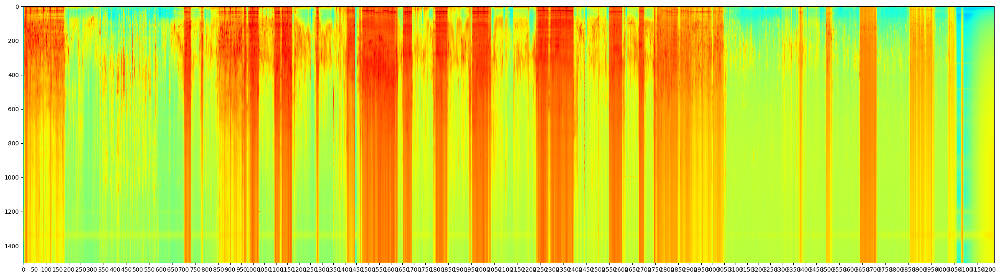

In [13]:
import h5py 
import numpy as np
import matplotlib.pyplot as plt
all_psd = []
ch_list = range(0,4224)
for ch in ch_list:
    psd = []
    for i in range(1,4):
        with h5py.File('/mnt/f/Highway_2024_0510/output/0628_data2/psd_7_1/psd_7_'+str(i)+'.hdf5', 'r') as f:
            if len(f[str(ch)].keys()) == 1 :
                dset = f[str(ch)]['01']
            else:
                dset = f[str(ch)]
            time = [key for key in dset.keys()]
            # start = time.index('04 15:10') #fi = 3  
            # end= time.index('04 15:40')
            # # start = time.index('01-05 03:10') #fi = 5  test5: 3:10-3:40
            # # end= time.index('01-05 03:40')
            # time = time[start:end+1]
            # print(time)

            psd.append(  [dset[key][:] for key in time])
            f.close()
    print("-----------read",ch,"------------")
    psd = np.concatenate(psd )
    # print("len(psd)",len(psd) , psd.shape)
    psd = np.mean(psd,axis=0) 
    # print("len(psd)",len(psd))
    # print("psd.shape",psd.shape)
    all_psd.append(psd)
    # print("len all_psd",len(all_psd))
all_psd= np.array(all_psd)
print(all_psd.shape)

sum_psd = np.sum(all_psd , axis = 1)
print(sum_psd.shape)

with h5py.File('/mnt/f/Highway_2024_0510/output/0628_data2/psd_7_1/all_psd.hdf5', 'w') as f:
    f.create_dataset("sum_psd" , data = sum_psd)

with h5py.File('/mnt/f/Highway_2024_0510/output/0628_data2/psd_7_1/all_psd.hdf5', 'a') as f:
    f.create_dataset("all_psd" , data = all_psd)

all_psd_s = np.log(all_psd)

plt.figure(figsize=(30,8))
plt.imshow(all_psd_s.T, aspect='auto', cmap='jet',vmin=-8, vmax=16)
# plt.imshow(psd.T, aspect='auto', cmap='viridis') 
ch_stick = [range(0,len(all_psd),50) , range(ch_list[0] * 8,  ch_list[1] * 8,50)]

fq_stick = [ np.linspace(0,len(all_psd[0]),11) ,np.linspace(0,500,11) ]
# print(f['frequency'].shape)

plt.xticks(ch_stick[0] ,ch_stick[1],rotation = 0)

plt.yticks(fq_stick[0],fq_stick[1])
plt.ylabel("Frequency")
plt.xlabel("Distance")
plt.grid()

plt.title("log(mean(PSD))  highway  test3  nfft=6000")

plt.colorbar()
plt.savefig('/mnt/f/Highway_2024_0510/output/0628_data2/psd_7_1/all_psd.fig') #10s per pic
plt.show()
plt.close()
#5-10s


<KeysViewHDF5 ['all_psd', 'sum_psd']>


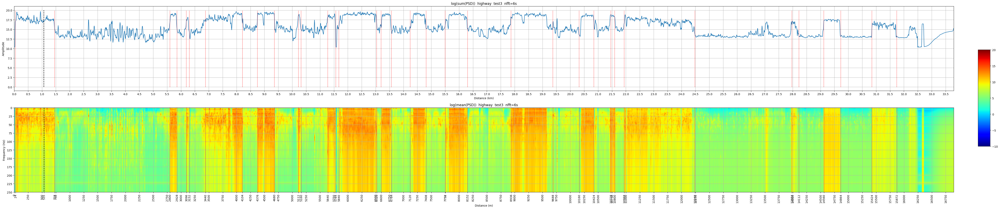

In [13]:
import DasBatch as db

mutation_stamp1 = [24, 29, 43, 99, 131, 170, 207, 330, 335, 390,406, 427, 434, 470, 531, 553, 587, 626, 667, 679, 715, 745, 765, 855, 888, 930, 966, 1009,
                  1018, 1059, 1069, 1085, 1107, 1157, 1238, 1251, 1260, 1310, 1343, 1350, 1381, 1400, 1411, 1570, 1697, 1730, 1788, 1804, 1860, 1898, 1968, 2024, 2054,  2068, 2084]
mutation_stamp = [ 43,     131,              390,406, 427, 434,   470,     553, 587,    625,         679,  685,  745, 763, 770, 855, 865, 888, 930, 966, 1009,
                  1059, 1157, 1251,  1310, 1343,  1381, 1390, 1411, 1570, 1788, 1804, 1860, 1898, 1968, 2024]

# for i in mutation_stamp:
#     print(i*8)   
db.show_sum_and_psd('/mnt/f/Highway_2024_0510/output/0628_data2/psd_7_1/all_psd.hdf5' , 
                    ch_list =  range(0,4224) , 
                    dis_spacing = 4, 
                    title =  "highway  test3  nfft=6s", 
                    save_path= "/mnt/f/Highway_2024_0510/output/0628_data2/psd_7_1/plot",
                    # mutation_th= 4,
                    mutations=[2*i-80  for i in mutation_stamp],
                    darkline= [1.070])


664
66
3032.679417268807 4 (4224, 60000)
1251.102196418339 4 (4224, 60000)


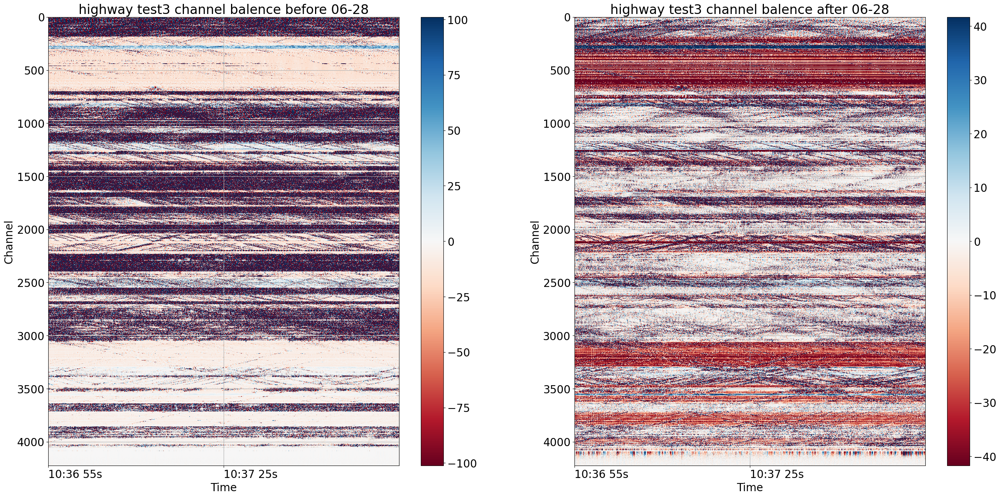

2948.8742926325135 4 (4224, 60000)
1271.6255675707873 4 (4224, 60000)


: 

: 

In [2]:
%matplotlib inline
import glob
import os
import DasBatch as db
flist = glob.glob('/mnt/f/Highway_2024_0510/Waihuan_HW_0628/data2/*.h5')
flist.sort()
print(len(flist))

path = '/mnt/f/Highway_2024_0510/output/0628_data2/psd_7_1/'
if not os.path.exists(path):
    os.makedirs(path)

print(int(len(flist)/10))

db.show_concat_channel_balenced(flist = flist ,
                            psdh5file= '/mnt/f/Highway_2024_0510/output/0628_data2/psd_7_1/all_psd.hdf5'  , 
                            start = 16, stop= 24, step =4,
                            title = "highway test3 channel balence " , 
                            decimate= 1,
                            clim_rate= 30,
                            save_path = path,
                            N = 30*1000)



In [ ]:
mutation_stamp = [ 43, 131,  390,406, 427, 434,   470,     553, 587,    625,  679,  685,  745, 763, 770, 855, 865, 888, 930, 966, 1009,
                  1059, 1157, 1251,  1310, 1343,  1381, 1390, 1411, 1570, 1788, 1804, 1860, 1898, 1968, 2024]
mutation_stamp = [2*i-80  for i in mutation_stamp]
mutation_stamp = [6, 182, 700, 732, 774, 788, 860, 1026, 1094, 1170, 1278, 1290, 1410, 1446, 1460, 1630, 1650, 1696, 1780, 1852, 1938, 2038, 2234,
                    2422, 2540, 2606, 2682, 2700, 2742, 3060, 3496, 3528, 3640, 3716, 3856, 3968]

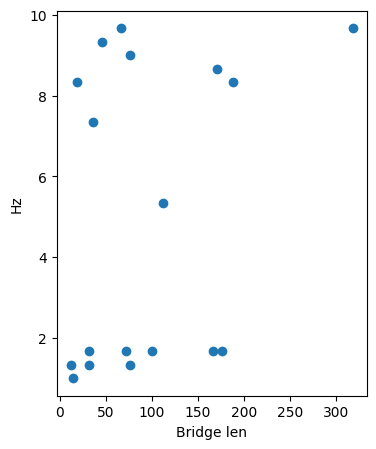

18


In [11]:
import h5py 
import numpy as np
import os
import matplotlib.pyplot as plt

path = '/mnt/f/Highway_2024_0510/output/psd_5_31/'
if not os.path.exists(path):
    os.makedirs(path)

mutation_stamp = [ 43, 131,  390,406, 427, 434,   470,     553, 587,    625,  679,  685,  745, 763, 770, 855, 865, 888, 930, 966, 1009,
                  1059, 1157, 1251,  1310, 1343,  1381, 1390, 1411, 1570, 1788, 1804, 1860, 1898, 1968, 2024]
mutation_stamp = [2*i-80  for i in mutation_stamp]
max_fre = []
for i in range(0 , len(mutation_stamp) -1  , 1):
    with h5py.File('/mnt/f/Highway_2024_0510/output/0628_data2/psd_7_1/all_psd.hdf5' , 'r') as f:
        all_psd = f['all_psd']
        max_fre.append(np.argmax(np.mean(all_psd[mutation_stamp[i]:mutation_stamp[i+1]],axis=0)[: len(all_psd[0])//50])/3)
bridge_len = [ ( -mutation_stamp[i]+mutation_stamp[i+1]) for i in range(0,len(mutation_stamp) , 2)]
plt.figure(figsize=[4,5])
plt.plot(bridge_len,max_fre[::2],'o')
plt.ylabel("Hz")
plt.xlabel("Bridge len")
plt.show()
print(len(max_fre[::2]))

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from DasTools import DasPrep as dp
import glob, os
import datetime


%%time

import os
from scipy import signal

M = np.array([10, 5])


daslist = glob.glob('H:\\FUTIAN\\Futian_20km_20230921\\*.h5')
daslist.sort()

savedir = '.\\futian_20km_2023_0921_deci_4Hz\\' 
if not os.path.exists(savedir):
    os.mkdir(savedir)

for ind in range(1, len(daslist)-1):
    datalen = np.array([dp.read_das(daslist[i],metadata=True)['nt'] for i in np.arange((ind-1),(ind+2))])
    Mlen = datalen // np.prod(M)
    
    data = np.concatenate([dp.read_das(daslist[i]) for i in np.arange((ind-1),(ind+2))], axis=-1)
    for iM in M:
        data = signal.decimate(data, iM, axis=-1).astype('float32')

    savename = savedir + os.path.basename(daslist[ind])[:-3] + '_4Hz.npy'
    print(savename)
    np.save(savename, data[:,(Mlen[0]):(Mlen[0]+Mlen[1])])

In [5]:
mutation_stamp = [6, 182, 700, 722, 764, 788, 850, 1026, 1084, 1170, 1268, 1290, 1410, 1446, 1460, 1630, 1650, 1696, 1780, 1852, 1938, 2038, 2234,
                    2392, 2540, 2606, 2682, 2700, 2742, 3050, 3496, 3528, 3640, 3716, 3856, 3968]
fiber_cum_len = [i*4 for i in mutation_stamp]

In [15]:
# savename = 'mnt/f/Highway_2024_0510/output/0628_data2/deci_7_7/wh_hw_17km_GL_10m_frq_500Hz_sp_4m_UTC_20240628_022925.084_10Hz.npy'
# data = np.load(savename)

import numpy as np
import matplotlib.pyplot as plt
from DasTools import DasPrep as dp
import glob, os
import datetime
import h5py
M = np.array([10, 5])
npylist = glob.glob('/mnt/f/Highway_2024_0510/output/0628_data2/deci_7_7/*.npy')
print(len(npylist))
npylist.sort()


data = np.concatenate([np.load(npylist[i]) for i in range(40,60)], axis=-1)

data = dp.das_preprocess(data)
data.shape


with h5py.File('/mnt/f/Highway_2024_0510/output/0628_data2/psd_7_1/all_psd.hdf5', 'r') as f:
    sum_psd = f['sum_psd'][:].reshape(-1,1)
    data = np.divide(data , sum_psd)


662


(0.0, 16896.0)

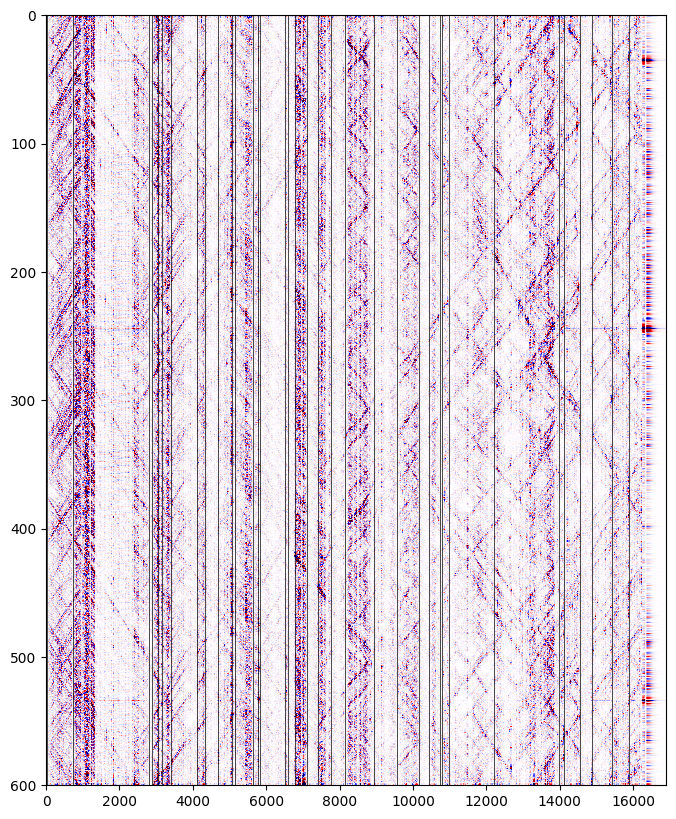

In [18]:
dt = 1./500
Mdt = dt*np.prod(M)
data = dp.bandpass(data, Mdt, fl=0.1, fh=0.8)

dx = 4

plt.figure(figsize=[8,10])

data_plot = data[:, :]/5
clim = data_plot.std() *2

plot_ext = [0, data_plot.shape[0]*dx, data_plot.shape[1]*Mdt, 0]
plt.imshow(data_plot.T, aspect='auto', cmap='seismic', vmin=-clim, vmax=clim, extent = plot_ext)

for i in fiber_cum_len:
    plt.axvline(i, color='k', linewidth=0.5)
    
plt.xlim([plot_ext[0], plot_ext[1]])


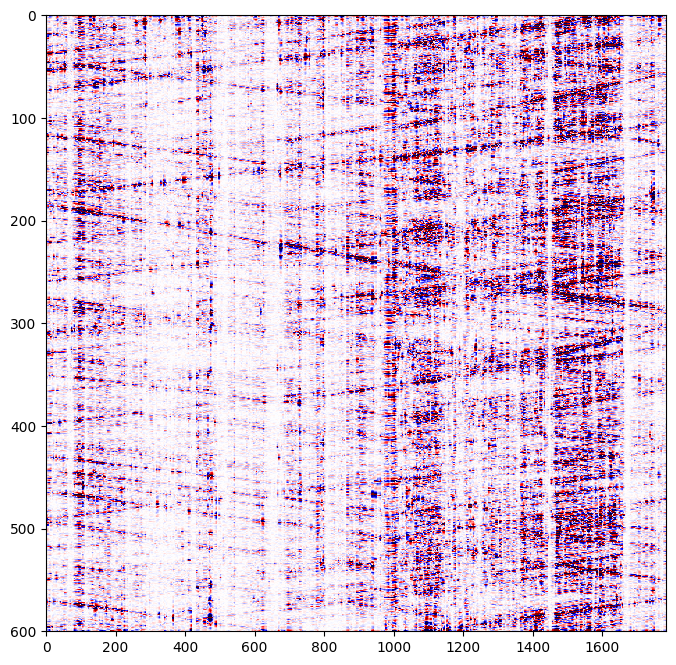

In [21]:
# dataEW = np.concatenate([data[:int(fiber_cum_len[1]/dx), :] for  ], axis=0)

dataEW = data[int(fiber_cum_len[29]/dx):int(fiber_cum_len[30]/dx), :]
# dataSN = np.concatenate([data[:int(fiber_cum_len[1]/dx), :], data[int(fiber_cum_len[5]/dx):int(fiber_cum_len[6]/dx), :]], axis=0)

dataEW.shape
plt.figure(figsize=[8,8])

data_plot = dataEW
clim = data_plot.std() *1.5

plot_ext = [0, data_plot.shape[0]*dx, data_plot.shape[1]*Mdt, 0]
plt.imshow(data_plot.T, aspect='auto', cmap='seismic', vmin=-clim, vmax=clim, extent = plot_ext)